In [1]:
#--------Loading in Packages------#
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy
from scipy.io import mmread
from scipy.sparse import csr_matrix
import seaborn as sns
import os
import tacco as tc

In [2]:
#-------Loading in Annotated Spatial Object-----#
adata_sub = sc.read_h5ad("/projects/b1217/HHA/Bulb_Spatial/20250516_HHA_Spatial_TACCO_Matrix_Subset.h5ad")
adata_sub

AnnData object with n_obs × n_vars = 10584 × 17931
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'matrix_annotation', 'MatrixAnnotationFine'
    var: 'ensembl', 'feature_types', 'genome', 'n_cells', 'symbol'
    uns: 'MatrixAnnotationFine_colors', 'matrix_annotation_colors', 'spatial'
    obsm: 'MatrixAnnotationFine', 'matrix_annotation', 'spatial'
    varm: 'MatrixAnnotationFine', 'matrix_annotation'
    layers: 'counts'

In [3]:
#--------Loading in Matrix scRNA-seq AnnData-------#
Matrix = sc.read_h5ad("/projects/b1217/HHA/Bulb_Recluster_5_22_AnnData/Matrix_Palantir_6_11_25.h5ad")
Matrix.X = Matrix.layers['raw']
#create new column in var as names
Matrix.var["names"] = Matrix.var.index.copy()
Matrix

AnnData object with n_obs × n_vars = 14780 × 48834
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'SampleID', 'DonorID', 'Platform', 'Isolation', 'Sex', 'Age', 'Source', 'Posterior_Ruptured', 'Likely_Ruptured_075', 'scDblFinder.class', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.difficulty', 'scDblFinder.cxds_score', 'DoubletStatus', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'unintegrated_clusters', 'seurat_clusters', 'scvi_clusters_2.0', 'scvi_clusters_1.5', 'scvi_clusters_1.2', 'scvi_clusters_1.0', 'scvi_clusters_0.8', 'scvi_clusters_0.75', 'scvi_clusters_0.6', 'scvi_clusters_0.5', 'scvi_clusters_0.4', 'scvi_clusters_0.3', 'InitialAnnotation', 'InitialAnnotationOrdered', 'UnifiedBarcode', 'DissociationScore', 'MultiomeAnnotationRNA', 'MultiomeAnnotationOrdered', 'scvi_clusters_0.85', 'BroadAnnotation', 'GlobalAnnotation', 'GlobalAnnotationOrdered', 'scvi_clusters_0.35', 'Barcode', 'BulbAnnotationBroad', 'GLAnnotation', 'IRSAnnotat

In [4]:
#------Loading in Metadata with Non-Cell Cycle Regressed Annotations-----#
updated_metadata = pd.read_csv("/projects/b1217/HHA/Multiome_Metadata/HHA_Updated_Metadata_7_3_25.csv")
updated_metadata = updated_metadata.set_index("Barcode")

#-------Adding Additional Metadata Columns------#
Matrix.obs["MatrixAnnotationCC"]  = updated_metadata["MatrixAnnotationCC"]
Matrix.obs["ProliferativeGrouping"]  = updated_metadata["ProliferativeGrouping"]
Matrix.obs

/tmp/ipykernel_678600/4281643095.py:2: DtypeWarning: Columns (13,23,36,37) have mixed types. Specify dtype option on import or set low_memory=False.
  updated_metadata = pd.read_csv("/projects/b1217/HHA/Multiome_Metadata/HHA_Updated_Metadata_7_3_25.csv")


,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.ribo,SampleID,DonorID,Platform,Isolation,Sex,...,UMAP_2,AdhesionScore,ProliferationScore,palantir_pseudotime_IRS,palantir_entropy_IRS,palantir_pseudotime_CoCu,palantir_entropy_CoCu,barcode,MatrixAnnotationCC,ProliferativeGrouping
barcode,,,,,,,,,,,,,,,,,,,,,
CAATACGGTAGTTACC-1_1,EL_A5,62210,7082,4.155281,13.549269,EL_A5,1,V3.1,FUE,M,...,-1.382226,0.032429,0.013230,NaN,NaN,0.834177,0.000035,CAATACGGTAGTTACC-1_1,Late Cortex,Other
CCTCATGAGATGCTTC-1_1,EL_A5,58667,7219,4.818723,13.378901,EL_A5,1,V3.1,FUE,M,...,-1.386279,0.081184,0.012472,NaN,NaN,0.839393,0.000033,CCTCATGAGATGCTTC-1_1,Late Cortex,Other
TCTACCGAGCGTGAAC-1_1,EL_A5,47534,5741,5.951529,25.415492,EL_A5,1,V3.1,FUE,M,...,0.033421,0.050668,0.016117,0.639593,0.476914,NaN,NaN,TCTACCGAGCGTGAAC-1_1,IRS,Other
CATTCCGTCCGTGGCA-1_1,EL_A5,47018,6854,6.195500,20.619763,EL_A5,1,V3.1,FUE,M,...,-0.818430,0.079457,0.029157,0.602575,0.571977,NaN,NaN,CATTCCGTCCGTGGCA-1_1,IRS,Other
ATACTTCAGCCTCAGC-1_1,EL_A5,45017,7211,1.965924,22.758069,EL_A5,1,V3.1,FUE,M,...,-3.448275,0.085482,0.043675,0.821512,0.632474,NaN,NaN,ATACTTCAGCCTCAGC-1_1,IRS,Other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ACACTTGCAGCAAGAT-1_5,EL_E8,1379,826,12.980421,8.339376,EL_E8,5,Multiome,Bulb,M,...,1.839127,0.065762,0.085567,NaN,NaN,0.089066,0.650726,ACACTTGCAGCAAGAT-1_5,Proliferating Cortex/Cuticle,Proliferating Cortex/Cuticle
GAGCTAGCAGCCAGAA-1_5,EL_E8,1187,713,23.588880,8.171862,EL_E8,5,Multiome,Bulb,M,...,0.712035,0.104174,0.033754,NaN,NaN,0.089217,0.672763,GAGCTAGCAGCCAGAA-1_5,Early Cortex,Other
GACGCAACACACTAAT-1_5,EL_E8,1206,772,14.676617,12.271973,EL_E8,5,Multiome,Bulb,M,...,-0.477634,0.127925,0.083547,NaN,NaN,0.105708,0.691601,GACGCAACACACTAAT-1_5,Proliferating Cortex/Cuticle,Proliferating Cortex/Cuticle


In [5]:
#--------Loading in Full scRNA Atlas-----#
HHA = sc.read_h5ad("/projects/b1217/Edward/R_Projects/HHA/h5ad/20250516_HHA-SC-Final.h5ad")

#-----Crossmapping var_names to EnsemblID--------#
symbol_to_ensembl = dict(zip(HHA.var["names"], HHA.var["ensembl"]))
def map_to_ensembl(name):
    if name.startswith("ENSG"):
        return name
    return symbol_to_ensembl.get(name, "Unknown")
Matrix.var["ensembl"] = Matrix.var["names"].apply(map_to_ensembl)

#-------Creating EnsemblID column and set as index--------#
Matrix = Matrix[:, Matrix.var["ensembl"] != "Unknown"].copy()
new_index = Matrix.var["ensembl"]
Matrix.var.index = new_index
Matrix.var_names = new_index
Matrix.var

,names,ensembl
ensembl,,
ENSG00000238009,ENSG00000238009,ENSG00000238009
ENSG00000241860,ENSG00000241860,ENSG00000241860
ENSG00000290385,ENSG00000290385,ENSG00000290385
ENSG00000291215,ENSG00000291215,ENSG00000291215
ENSG00000237491,LINC01409,ENSG00000237491
...,...,...
ENSG00000258643,BCL2L2-PABPN1,ENSG00000258643
ENSG00000212659,KRTAP9-6,ENSG00000212659
ENSG00000211642,IGLV10-54,ENSG00000211642


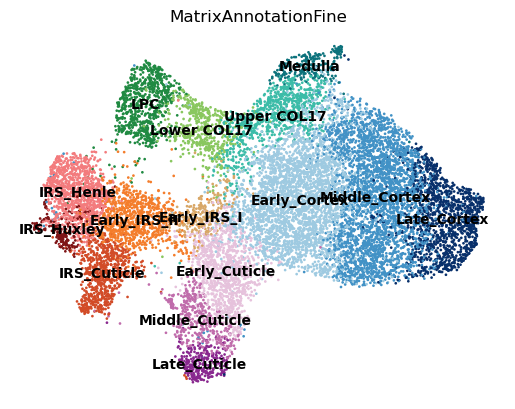

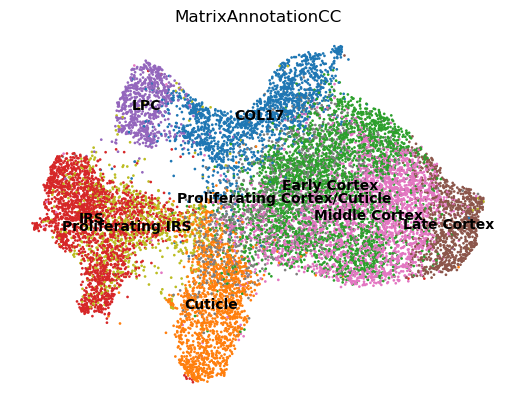

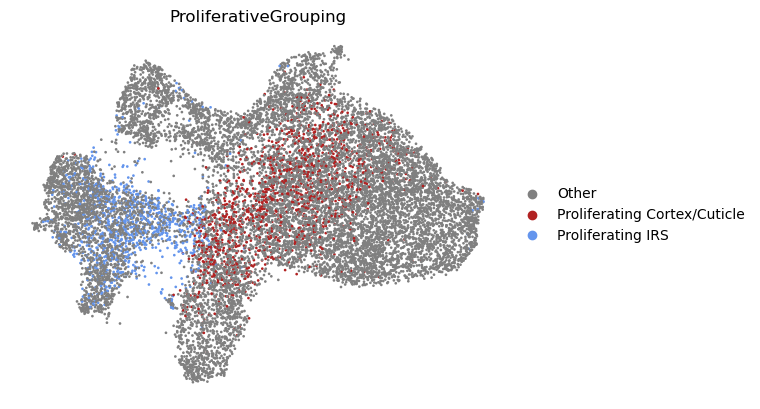

In [6]:
#--------Color Dictionaries------#
#Colors for Fine Annotation
fine_colors = {"Lower COL17": "#89C75F",
               "Upper COL17": "#3BBCA8",
               "LPC": "#208A42",
               "Medulla": "#0C727C",
               "Early_Cortex": "#9ECAE1",
               "Middle_Cortex": "#4292C6",
               "Late_Cortex": "#08306B",
               "Early_Cuticle": "#E6C2DC",
               "Middle_Cuticle": "#C06CAB",
               "Late_Cuticle": "#89288F",
               "Early_IRS_I": "#D8A767",
               "Early_IRS_II": "#F47D2B",
               "IRS_Henle": "#F37B7D",
               "IRS_Huxley": "#7E1416",
               "IRS_Cuticle": "#D24B27"}
proliferation_colors = {"Other": "#808080",
                       "Proliferating Cortex/Cuticle": '#B22222',
                       "Proliferating IRS": "#6495ED"}
#--------Plotting UMAPs------#
#Fine Annotation
sc.pl.umap(Matrix, color="MatrixAnnotationFine", palette = fine_colors,
    frameon=False, size = 15, legend_loc="on data")
#Proliferative Grouping
sc.pl.umap(Matrix, color="MatrixAnnotationCC",
    frameon=False, size = 15, legend_loc="on data")
#CC Group
sc.pl.umap(Matrix, color="ProliferativeGrouping", palette = proliferation_colors,
           frameon = False, size = 15)

In [7]:
#------Running TACCO on Matrix using Proliferation Annotations------#
tc.tl.annotate(adata_sub, Matrix, annotation_key='ProliferativeGrouping', result_key='ProliferativeGrouping')

Starting preprocessing
Annotation profiles were not found in `reference.varm["ProliferativeGrouping"]`. Constructing reference profiles with `tacco.preprocessing.construct_reference_profiles` and default arguments...
Finished preprocessing in 9.49 seconds.
Starting annotation of data with shape (10584, 14142) and a reference of shape (14780, 14142) using the following wrapped method:
+- platform normalization: platform_iterations=0, gene_keys=ProliferativeGrouping, normalize_to=adata
   +- multi center: multi_center=None multi_center_amplitudes=True
      +- bisection boost: bisections=4, bisection_divisor=3
         +- core: method=OT annotation_prior=None
mean,std( rescaling(gene) )  0.4119080819638469 1.8231470393251623
bisection run on 1
bisection run on 0.6666666666666667
bisection run on 0.4444444444444444
bisection run on 0.2962962962962963
bisection run on 0.19753086419753085
bisection run on 0.09876543209876543
Finished annotation in 9.31 seconds.


AnnData object with n_obs × n_vars = 10584 × 17931
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'matrix_annotation', 'MatrixAnnotationFine'
    var: 'ensembl', 'feature_types', 'genome', 'n_cells', 'symbol'
    uns: 'MatrixAnnotationFine_colors', 'matrix_annotation_colors', 'spatial'
    obsm: 'MatrixAnnotationFine', 'matrix_annotation', 'spatial', 'ProliferativeGrouping'
    varm: 'MatrixAnnotationFine', 'matrix_annotation', 'ProliferativeGrouping'
    layers: 'counts'

In [8]:
#-----Retrieving Best Annotation Mapping for Each Cluster------#
tc.utils.get_maximum_annotation(adata_sub, 'ProliferativeGrouping', result_key='ProliferativeGrouping')
adata_sub

AnnData object with n_obs × n_vars = 10584 × 17931
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'matrix_annotation', 'MatrixAnnotationFine', 'ProliferativeGrouping'
    var: 'ensembl', 'feature_types', 'genome', 'n_cells', 'symbol'
    uns: 'MatrixAnnotationFine_colors', 'matrix_annotation_colors', 'spatial'
    obsm: 'MatrixAnnotationFine', 'matrix_annotation', 'spatial', 'ProliferativeGrouping'
    varm: 'MatrixAnnotationFine', 'matrix_annotation', 'ProliferativeGrouping'
    layers: 'counts'

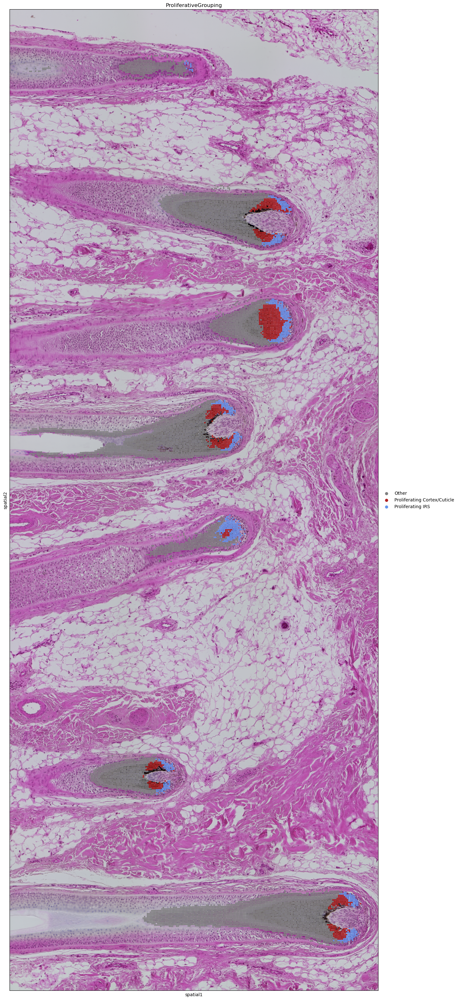

<Figure size 640x480 with 0 Axes>

In [9]:
#--------Plotting Final TACCO Annotations in Space------#
proliferation_colors_spatial = {"Other": "#00000000",
                       "Proliferating Cortex/Cuticle": '#B22222',
                       "Proliferating IRS": "#6495ED"}
fig, ax = plt.subplots(figsize=(40, 40))
sc.pl.spatial(adata_sub, color=["ProliferativeGrouping"], palette = proliferation_colors, img_key="hires", ax=ax)
plt.tight_layout()

In [10]:
#--------------Subsetting for Cells in Proliferative Clusters---------------#
adata_prolif = adata_sub[adata_sub.obs["ProliferativeGrouping"].isin(["Proliferating Cortex/Cuticle", "Proliferating IRS"])].copy()
adata_prolif

AnnData object with n_obs × n_vars = 1786 × 17931
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'matrix_annotation', 'MatrixAnnotationFine', 'ProliferativeGrouping'
    var: 'ensembl', 'feature_types', 'genome', 'n_cells', 'symbol'
    uns: 'MatrixAnnotationFine_colors', 'matrix_annotation_colors', 'spatial', 'ProliferativeGrouping_colors'
    obsm: 'MatrixAnnotationFine', 'matrix_annotation', 'spatial', 'ProliferativeGrouping'
    varm: 'MatrixAnnotationFine', 'matrix_annotation', 'ProliferativeGrouping'
    layers: 'counts'

In [11]:
#-------Writing objects to h5ad-------#
adata_prolif.write_h5ad("/projects/b1217/HHA/Bulb_Spatial/20250516_HHA_Spatial_No_CC_Proliferation_Subset.h5ad")